In [9]:
#!pip install bertopic==0.14.1

In [1]:
from umap import UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np
np.random.seed(42)
from wordcloud import WordCloud
import matplotlib.pyplot as plt

C:\Users\Vojimir Ranitovic\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\Vojimir Ranitovic\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\Vojimir Ranitovic\A

In [2]:
# Load the DataFrame from the CSV file
df = pd.read_csv(r'C:\Users\Vojimir Ranitovic\Desktop\Master CEO dataset\Topic modeling\all_dataset_lemmatized.csv')

# Load the corpus from the text file. Corpus is already cleaned and lemmatized tweets
with open('corpus.txt', 'r') as file:
    corpus = file.read().splitlines()


C:\Users\Vojimir Ranitovic\AppData\Local\Temp\ipykernel_10532\4090922338.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'C:\Users\Vojimir Ranitovic\Desktop\Master CEO dataset\Topic modeling\all_dataset_lemmatized.csv')


In [ ]:
### Using BERTopic

In [4]:
# Extract embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Dimensionality reduction with umap
umap_model = UMAP(n_neighbors=20, n_components=5, min_dist=0.05, metric='cosine',random_state=42)

# Clustering with hdbscan
hdbscan_model = HDBSCAN(min_cluster_size=1000, min_samples=100, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# Tokenize topics with TF-IDF vectorizer
vectorizer_model = TfidfVectorizer(stop_words="english")

#  Create topic representation
ctfidf_model = ClassTfidfTransformer()

# Fine-tune topic representations with `bertopic.representation` model
representation_model = KeyBERTInspired()

topic_model = BERTopic(
    embedding_model=embedding_model,
    verbose=True,
    calculate_probabilities=True,
    language="english",
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model,
    representation_model=representation_model,
)

In [6]:
# Training BERTopic
topics, probs = topic_model.fit_transform(corpus)

In [35]:
# Saving the model
#topic_model.save("bertopic_model_128_topicsnn=20,minclus=1000,min_samples=100")
# Save the variables to a file (e.g., using NumPy's savez function)
#np.savez('topic_model_results.npz', topics=topics, probs=probs)

### Loading BERTopic -> For tuning

In [3]:
# Loading
data = np.load('topic_model_results.npz')
topics = data['topics']
probs = data['probs']
topic_model = BERTopic.load("bertopic_model_128_topicsnn=20,minclus=1000,min_samples=100")

In [4]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,409294,-1_people_religious_religion_life
1,0,43361,0_atheist_atheism_agnostic_friendly
2,1,12164,1_election_vote_trump_voter
3,2,11754,2_muslim_islamic_isis_islamist
4,3,11626,3_school_student_education_teacher
...,...,...,...
123,122,1030,122_argument_opinion_argumentation_worthless
124,123,1025,123_sander_cruz_rubio_marco
125,124,1014,124_freedom_expression_liberty_report
126,125,1007,125_military_veteran_soldier_troop


In [5]:
new_topics = topic_model.reduce_outliers(corpus, topics, probabilities=probs, strategy="probabilities",threshold=0.005)

In [6]:
topic_model.update_topics(corpus, new_topics,top_n_words=10)


In [7]:
topic_model.get_topic_info() #reduced number of outliers

,Topic,Count,Name
0,-1,81207,-1_cancer_conversion_therapy_romney_hitchen
1,0,51892,0_atheist_atheism_agnostic_friendly
2,1,19876,1_trump_election_vote_voter
3,2,13734,2_muslim_islamic_isis_islamist
4,3,13030,3_school_student_education_teacher
...,...,...,...
123,122,4971,122_argument_opinion_fallacy_respect
124,123,2129,123_sander_cruz_pete_wikileak
125,124,2861,124_freedom_expression_liberty_tolerance
126,125,3395,125_military_border_canadian_soldier


In [ ]:
#top_topics_keywords = topic_model.get_topics()
#top_topics_keywords

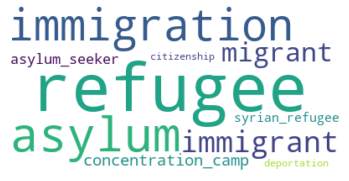

In [12]:
def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=15)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=98)

In [12]:
#topic_model.transform("") # for checking where text is possibly assigned

### Reducing topics

In [10]:
#topic_model.reduce_topics(corpus, nr_topics=100)


In [41]:
k=topic_model.visualize_heatmap(n_clusters=0)
#k

In [18]:
#topic_model.visualize_topics()

In [10]:
h=topic_model.visualize_hierarchy(orientation="left")
h

In [19]:
import plotly.io as pio

# Set the desired DPI
dpi = 500

# Save the heatmap as a high-resolution image
pio.write_image(h, 'hier.pdf', format='pdf', scale=dpi/100)

In [9]:
topics_to_merge = [[79,8],[23,15],[3,4,109],[74,18],[61,26],[69,86],[78,13],[64,124],[43,49]]
topic_model.merge_topics(corpus, topics_to_merge)

In [10]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,81207,-1_cancer_conversion_therapy_romney_hitchen
1,0,51892,0_atheist_atheism_agnostic_friendly
2,1,28702,1_school_education_student_faith
3,2,19876,2_trump_election_vote_voter
4,3,17385,3_religion_religious_christianity_christian
...,...,...,...
113,112,1520,112_billboard_atheist_american_group
114,113,1489,113_chaplain_chaplaincy_military_duggar
115,114,1422,114_radio_show_host_interview
116,115,1299,115_theist_irrational_ontological_victor


In [11]:
topic_model.set_topic_labels({-1:'Outliers',0: 'Atheism and Agnosticism',
 1: 'Education and Religion',
 2: 'Election Campaigns',
 3: 'Religion and Belief',
 4: 'Online Talk and Memes',
 5: 'Religious Freedom and Discrimination',
 6: 'Biology and Genetics',
 7: 'Muslim Identity',
 8: 'Humanism',
 9: 'Critical Thinking',
 10: 'Money and Business',
 11: 'Catholic Church Scandals',
 12: 'Church and Religious Leaders',
 13: 'Humor and Informal Talks',
 14: "Women's Rights",
 15: 'Secularism and Society',
 16: 'Urban Exploration',
 17: 'Social Media Influence',
 18: 'Crime and Justice System',
 19: 'Same-Sex Marriage',
 20: 'Online Videos and YouTube',
 21: 'Astronomy and Space',
 22: 'Community and Social Support',
 23: 'Fashion and Accessories',
 24: 'Legislation and Politics',
 25: 'Negative emotions and conflict',
 26: 'Animal Welfare\Dietary Choices',
 27: 'Entertainment and media',
 28: 'Family and Parenting',
 29: 'Religion and Spirituality',
 30: 'Books and literature',
 31: 'Events and meetings',
 32: 'Nature',
 33: 'Abortion',
 34: 'Vaccines and COVID-19',
 35: 'Food',
 36: 'Blasphemy and Irish Law',
 37: 'Freedom of Expression',
 38: 'Prayer in Public Spaces',
 39: 'Science and Scientific Inquiry',
 40: 'Online Discussions',
 41: 'Music',
 42: 'Race and Discrimination',
 43: 'Photography',
 44: 'Blogging',
 45: 'Health and Medicine',
 46: 'Culture and Society',
 47: 'Mind and Consciousness',
 48: 'Ethics and Morality',
 49: 'LGBTQ+',
 50: 'Bible Studies',
 51: 'Paleontology',
 52: 'Faith and Science',
 53: 'Abuse and Harassment',
 54: 'Argument and Reasoning',
 55: 'Legal System and Courts',
 56: 'News and Journalism',
 57: 'Climate Change',
 58: 'Economics and Wealth Distribution',
 59: 'Holidays',
 60: 'Entertainment and Podcasts',
 61: 'Time Scheduling',
 62: 'Occult and Supernatural',
 63: 'Celebration and Achievements',
 64: 'New Resolutions',
 65: 'Podcasts',
 66: 'Public Speaking PR',
 67: 'Donations and Volunteering',
 68: 'Hinduism',
 69: 'Richard Dawkins',
 70: 'Humanist Weddings',
 71: 'Superstitions and Mythology',
 72: 'Natural Disasters',
 73: 'Creationism',
 74: 'Supernatural Beliefs',
 75: 'Daily Routines and Well-being',
 76: 'Evidence and Proof',
 77: 'Middle East Relations',
 78: 'Commemoration and Memorials',
 79: 'Military and Borders',
 80: 'Fascism and Extremism',
 81: 'Online Trolling and Satire',
 82: 'Grief and Loss',
 83: 'Gun Violence',
 84: 'Terrorism',
 85: 'Tickets and Reservations',
 86: 'Sport',
 87: 'Discrimination and Prejudice',
 88: 'Belief Systems and Faiths',
 89: 'Alcohol and Drugs',
 90: 'Birth Control',
 91: 'Evangelical Christianity',
 92: 'Freedom of Speech',
 93: 'Wildlife Photography',
 94: 'Jewish Identity',
 95: 'Protests and Riots',
 96: 'Skepticism and Inquiry',
 97: 'Emails and Contacts',
 98: 'Immigration Issues',
 99: 'Celebrations and Special Occasions',
 100: 'Slavery',
 101: 'Selling Shops',
 102: 'Politicians',
 103: 'Political Ideologies',
 104: 'Church Separation',
 105: 'Debate and Controversy',
 106: 'Sexual Violence',
 107: 'Freedom of Religion and Secularism',
 108: 'MorningHeresy',
 109: 'Cats',
 110: 'Interviews',
 111: 'Human Rights in Bangladesh',
 112: 'Atheist Campaings',
 113: 'Military Chaplaincy',                             
 114: 'Radio Shows',
 115: 'Theism and Rationality',
 116: 'Conspiracy Theories'})
topic_model.custom_labels_

['Outliers',
 'Atheism and Agnosticism',
 'Education and Religion',
 'Election Campaigns',
 'Religion and Belief',
 'Online Talk and Memes',
 'Religious Freedom and Discrimination',
 'Biology and Genetics',
 'Muslim Identity',
 'Humanism',
 'Critical Thinking',
 'Money and Business',
 'Catholic Church Scandals',
 'Church and Religious Leaders',
 'Humor and Informal Talks',
 "Women's Rights",
 'Secularism and Society',
 'Urban Exploration',
 'Social Media Influence',
 'Crime and Justice System',
 'Same-Sex Marriage',
 'Online Videos and YouTube',
 'Astronomy and Space',
 'Community and Social Support',
 'Fashion and Accessories',
 'Legislation and Politics',
 'Negative emotions and conflict',
 'Animal Welfare\\Dietary Choices',
 'Entertainment and media',
 'Family and Parenting',
 'Religion and Spirituality',
 'Books and literature',
 'Events and meetings',
 'Nature',
 'Abortion',
 'Vaccines and COVID-19',
 'Food',
 'Blasphemy and Irish Law',
 'Freedom of Expression',
 'Prayer in Public

In [12]:
names=topic_model.get_topic_info()
names

,Topic,Count,Name,CustomName
0,-1,81207,-1_cancer_conversion_therapy_romney_hitchen,Outliers
1,0,51892,0_atheist_atheism_agnostic_friendly,Atheism and Agnosticism
2,1,28702,1_school_education_student_faith,Education and Religion
3,2,19876,2_trump_election_vote_voter,Election Campaigns
4,3,17385,3_religion_religious_christianity_christian,Religion and Belief
...,...,...,...,...
113,112,1520,112_billboard_atheist_american_group,Atheist Campaings
114,113,1489,113_chaplain_chaplaincy_military_duggar,Military Chaplaincy
115,114,1422,114_radio_show_host_interview,Radio Shows
116,115,1299,115_theist_irrational_ontological_victor,Theism and Rationality


In [89]:
top_topics_keywords = topic_model.get_topics()
top_topics_keywords

{-1: [('cancer', 0.008187864789378914),
  ('conversion_therapy', 0.007044998181768442),
  ('romney', 0.006827708719961648),
  ('hitchen', 0.006232921912848842),
  ('torture', 0.006148519537913938),
  ('blood', 0.005943121016842634),
  ('homeopathy', 0.005824260269610822),
  ('heart', 0.005720544094170571),
  ('people', 0.005577292597569405),
  ('scout', 0.005566743651567787)],
 0: [('atheist', 0.08176404506635127),
  ('atheism', 0.05961924601954807),
  ('agnostic', 0.01817783323149539),
  ('friendly', 0.010112442224328982),
  ('religion', 0.009034309488631828),
  ('american', 0.009028425540248615),
  ('group', 0.007412785630255723),
  ('blog', 0.007210160657890005),
  ('belief', 0.007178574084238548),
  ('theist', 0.007099825371908439)],
 1: [('school', 0.07085701036446944),
  ('education', 0.044283642946203565),
  ('student', 0.03749164815492349),
  ('faith', 0.023252574177509595),
  ('teacher', 0.022694699313670755),
  ('religious', 0.021462623578969924),
  ('child', 0.02125069456277

In [22]:
t=topic_model.visualize_barchart(topics=[2,3],n_words=10,custom_labels=True
                                ,title='',width=250,height=250)
t

In [24]:
import plotly.io as pio

# Set the desired DPI
dpi = 500

# Save the heatmap as a high-resolution image
pio.write_image(t, 'first4.svg', format='svg', scale=dpi/100)

In [94]:
t=topic_model.visualize_barchart(top_n_topics=120,n_words=5)
t

In [18]:
import plotly.io as pio

# Set the desired DPI
dpi = 500

# Save the heatmap as a high-resolution image
pio.write_image(t, 'topic_names.pdf', format='pdf', scale=dpi/100)

In [17]:
newest_topics = topic_model.topics_

In [18]:
df["topic"] = newest_topics

In [19]:
topic_to_customname = dict(zip(names['Topic'], names['CustomName']))

# Add the 'CustomName' column to df based on the 'topic' column
df['CustomName'] = df['topic'].map(topic_to_customname)
df.head(5)

,username,tweet,clean_tweet,date,location,likes,retweets,followers,tweet_url,preprocessed_tweet,topic,CustomName
0,AAAPORG,b'This Pakistani lecturer has spent six years ...,pakistani lecturer spent years prison facing d...,2019-12-06 10:29:17+00:00,"Islamabad, Pakistan",10,4,241,https://twitter.com/AAAPORG/status/12028977947...,pakistani lecturer year prison death sentence ...,77,Middle East Relations
1,AAAPORG,b'We stands with the students marching for the...,stands students marching rights across pakista...,2019-11-29 07:06:57+00:00,"Islamabad, Pakistan",6,0,241,https://twitter.com/AAAPORG/status/12003101619...,student right peaceful protest human right,95,Protests and Riots
2,AAAPORG,b'Being a nonbeliever is not an easy thing in ...,nonbeliever easy pakistan religion persons ide...,2019-11-28 19:33:45+00:00,"Islamabad, Pakistan",5,2,241,https://twitter.com/AAAPORG/status/12001357118...,nonbeliever easy religion person identity blas...,0,Atheism and Agnosticism
3,AAAPORG,"b'Sunday ,27 October 2019 Millions of Pakistan...",sunday october millions pakistanis receiving t...,2019-10-27 14:14:52+00:00,"Islamabad, Pakistan",2,2,241,https://twitter.com/AAAPORG/status/11884590506...,million pakistani text message government warn...,77,Middle East Relations
4,AAAPORG,b'How Humanist are you.? \nhttps://t.co/d8ldM0...,humanist,2019-10-22 22:51:50+00:00,"Islamabad, Pakistan",1,0,241,https://twitter.com/AAAPORG/status/11867772090...,humanist,8,Humanism


In [21]:
#df.to_csv("tweets_with_topics.csv", index=False)

In [20]:
count = df['topic'].value_counts()[-1]

print("Count of -1 in 'topic' column:", count)

Count of -1 in 'topic' column: 81207


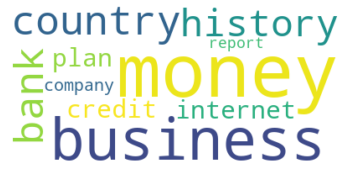

In [87]:
def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=20)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=10)

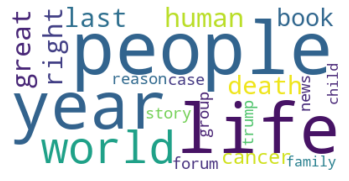

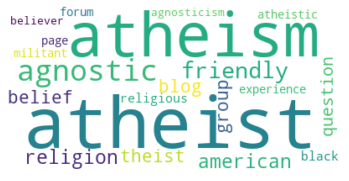

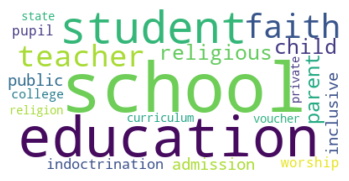

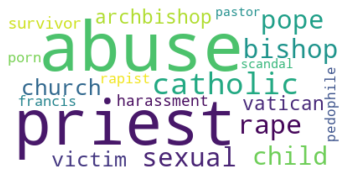

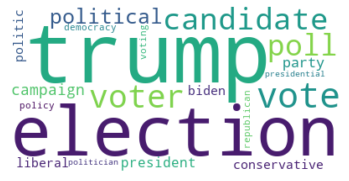

...

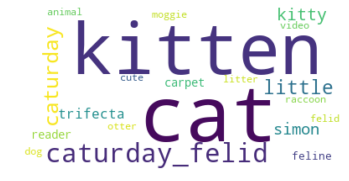

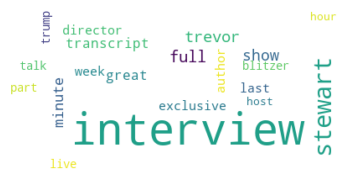

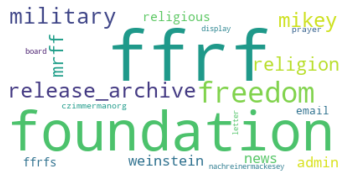

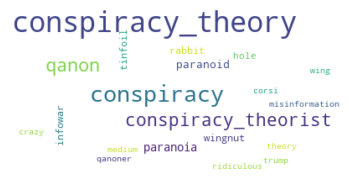

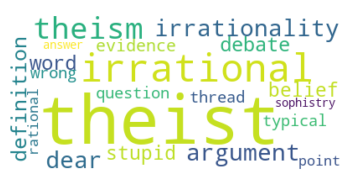

In [49]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=20)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Loop through topics -1 to 109 and plot word clouds
for topic in range(-1, 110):
    create_wordcloud(topic_model, topic)


In [12]:
#checing atributes
dir(topic_model)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_auto_reduce_topics',
 '_c_tf_idf',
 '_cluster_embeddings',
 '_create_topic_vectors',
 '_extract_embeddings',
 '_extract_representative_docs',
 '_extract_topics',
 '_extract_words_per_topic',
 '_get_param_names',
 '_guided_topic_modeling',
 '_map_predictions',
 '_map_probabilities',
 '_merged_topics',
 '_outliers',
 '_preprocess_text',
 '_reduce_dimensionality',
 '_reduce_to_n_topics',
 '_reduce_topics',
 '_save_representative_docs',
 '_sort_mappings_by_frequency',
 '_top_n_idx_sparse',
 '_top_n_values_sparse',
 '_update_topic_size',
 'approximate_distribution',
 'c_tf_idf_',
 'calculate_probabilities',
 'ctfidf_model',
